# Prac 06.1

For this homework we are not going to provide you with any code, you'll have to build the face detector on your own.

### Step 0

Run the necessary imports.

In [ ]:
import cv2
import dlib
import numpy as np
from matplotlib import pyplot as plt

### Step 1

Load an image (any image that contains faces).

In [ ]:
img_path = "zelensky.jpg"
img_bgr = cv2.imread(img_path)

img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

### Step 2

Load the dlib face predictor.

In [ ]:
detector = dlib.get_frontal_face_detector()

### Step 3

Run the predictor on your image.

In [ ]:
rects = detector(gray, 1)

### Step 4

Draw bounding boxes around the detected faces and plot the image. Use different colour for each face.

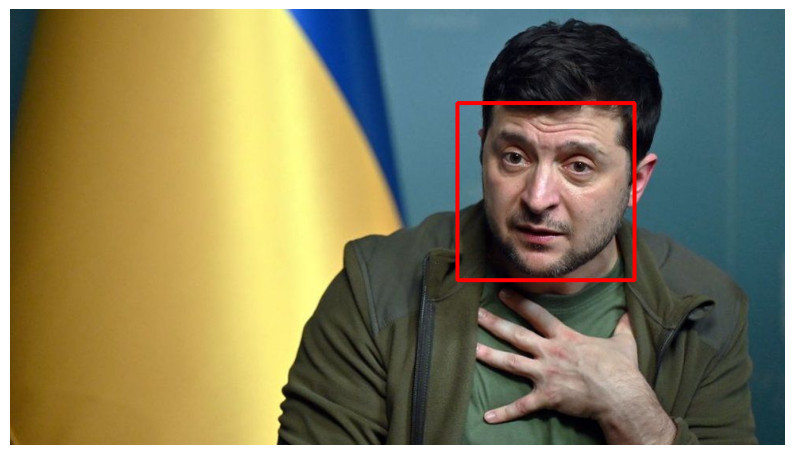

In [ ]:
result = np.copy(img)
colors = [(255,0,0), (0,255,0), (0,0,255), (255,255,0), (0,255,255)]

for i, rect in enumerate(rects):
    x1, y1 = rect.left(), rect.top()
    x2, y2 = rect.right(), rect.bottom()

    cv2.rectangle(result, (x1, y1), (x2, y2), colors[i % len(colors)], 3)

# Show result
plt.figure(figsize=(10,6))
plt.imshow(result)
plt.axis('off')
plt.show()

### Step 5 (optional)

Repeat the process with a different and more challenging image (more faces, smaller faces, people with glasses, hats, helmets, etc.). How does the detector perform? Is it robust?

In [ ]:
def detect(image_path):
    print(f"\nProcessing: {image_path}")

    img_bgr = cv2.imread(image_path)

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    rects = detector(gray, 1)

    result = np.copy(img_rgb)

    for i, rect in enumerate(rects):
        x1, y1 = rect.left(), rect.top()
        x2, y2 = rect.right(), rect.bottom()
        cv2.rectangle(result, (x1, y1), (x2, y2), colors[i % len(colors)], 3)

    plt.figure(figsize=(10,6))
    plt.imshow(result)
    plt.title(f"{image_path} | Detected faces: {len(rects)}")
    plt.axis('off')
    plt.show()
    plt.close()


Processing: evil.png


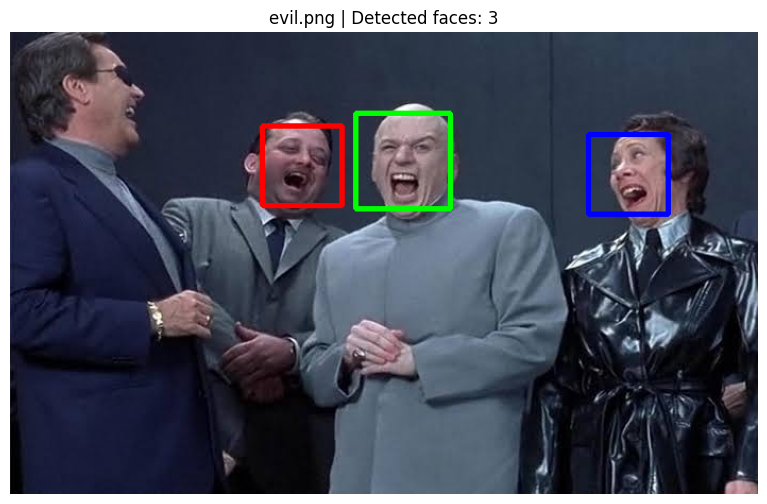

In [ ]:
detect("evil.png")


Processing: junior.png


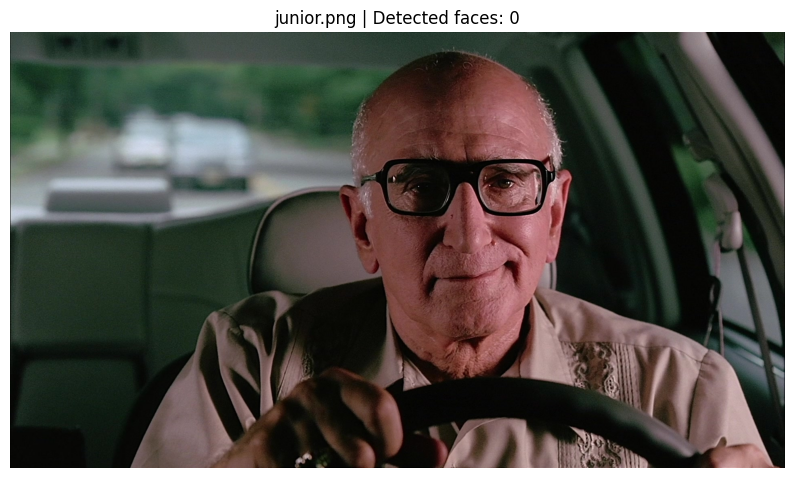

In [ ]:
detect("junior.png")


Processing: zoolander.png


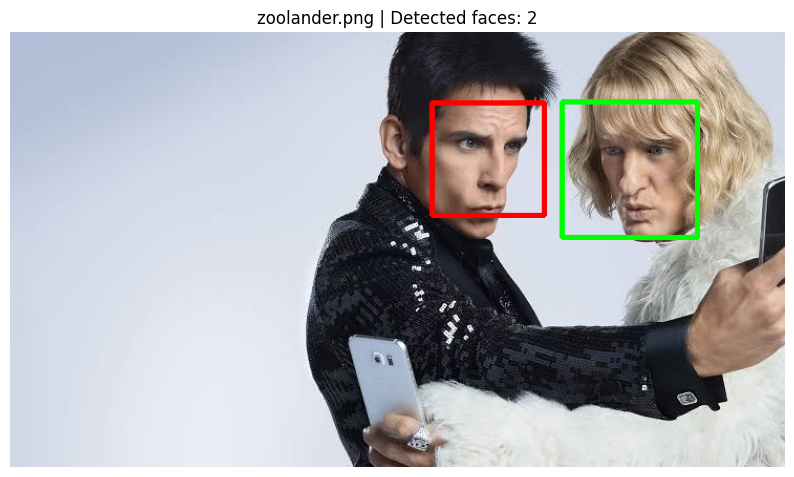

In [ ]:
detect("zoolander.png")

# Prac 06.2




In this homework, you are going to use and compare two different trackers (of your liking) and compare the results.

### Step 1
Decide what video you are going to use for this homework, select an object and generate the template. You can use any video you want (your own, from Youtube, etc.)
and track any object you want (e.g. a car, a pedestrian, etc.).

### Step 2
Initialize a tracker (e.g. KCF).

### Step 3
Run the tracker on the video and the selected object. Run the tracker for around 10-15 frames.

### Step 4
For each frame, print the bounding box on the image and save it.

### Step 5
Select a different tracker (e.g. CSRT) and repeat steps 2, 3 and 4.

In [ ]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

plt.rcParams['figure.figsize'] = (12, 7)
cv2.ocl.setUseOpenCL(False)

In [ ]:
def create_tracker(kind: str):
    k = kind.strip().upper()
    if hasattr(cv2, "legacy"):
        if k == "KCF"  and hasattr(cv2.legacy, "TrackerKCF_create"):  return cv2.legacy.TrackerKCF_create()
        if k == "CSRT" and hasattr(cv2.legacy, "TrackerCSRT_create"): return cv2.legacy.TrackerCSRT_create()
        if k == "MIL"  and hasattr(cv2.legacy, "TrackerMIL_create"):  return cv2.legacy.TrackerMIL_create()
    if k == "KCF"  and hasattr(cv2, "TrackerKCF_create"):  return cv2.TrackerKCF_create()
    if k == "CSRT" and hasattr(cv2, "TrackerCSRT_create"): return cv2.TrackerCSRT_create()
    if k == "MIL"  and hasattr(cv2, "TrackerMIL_create"):  return cv2.TrackerMIL_create()
    raise RuntimeError(f"Unsupported tracker: {kind}")

def sanitize_bbox(frame_shape, bbox, min_size=32):
    H, W = frame_shape[:2]
    x, y, w, h = [int(round(v)) for v in bbox]
    x = max(0, min(x, W-1)); y = max(0, min(y, H-1))
    w = max(0, w); h = max(0, h)
    if x + w > W: w = W - x
    if y + h > H: h = H - y
    if w < min_size:
        w = min_size;  x = max(0, min(x, W - w))
    if h < min_size:
        h = min_size;  y = max(0, min(y, H - h))
    return (x, y, w, h)

def expand_bbox(frame_shape, bbox, pad=30, min_size=32):
    H, W = frame_shape[:2]
    x, y, w, h = [int(v) for v in bbox]
    x = max(0, x - pad); y = max(0, y - pad)
    w = min(W - x, w + 2*pad); h = min(H - y, h + 2*pad)
    if w < min_size: w = min_size; x = max(0, min(x, W - w))
    if h < min_size: h = min_size; y = max(0, min(y, H - h))
    return (x, y, w, h)

def draw_bbox(img, bbox, color=(0,255,0), label=None):
    x, y, w, h = map(int, bbox)
    cv2.rectangle(img, (x, y), (x+w, y+h), color, 2)
    if label:
        cv2.putText(img, label, (x, max(0, y-7)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2, cv2.LINE_AA)

In [ ]:
def run_tracker(video_path, tracker_name, init_bbox, start_frame, n_frames, out_dir,
                color=(0,255,0), show=True):
    os.makedirs(out_dir, exist_ok=True)
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise RuntimeError(f"Cannot open video: {video_path}")
    if start_frame > 0:
        cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)

    ok, frame = cap.read()
    if not ok or frame is None:
        cap.release()
        raise RuntimeError("Cannot read first frame at start_frame.")
    frame = frame.copy()

    # нормалізуємо ROI й намагаємося ініціалізувати трекер; якщо ні — розширюємо один раз
    init_bbox = sanitize_bbox(frame.shape, init_bbox, min_size=32)
    tracker = create_tracker(tracker_name)
    ok = tracker.init(frame, init_bbox)
    if not ok:
        init_bbox = sanitize_bbox(frame.shape, expand_bbox(frame.shape, init_bbox, pad=30, min_size=32), min_size=32)
        tracker = create_tracker(tracker_name)
        ok = tracker.init(frame, init_bbox)
    if not ok:
        cap.release()
        raise RuntimeError(f"{tracker_name}: tracker.init() failed. Try a larger/shifted ROI.")

    frame_idx = start_frame
    draw_bbox(frame, init_bbox, color, label=f"{tracker_name} f={frame_idx}")
    cv2.imwrite(os.path.join(out_dir, f"frame_{frame_idx:06d}.jpg"), frame)
    if show:
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)); plt.axis('off'); plt.show(); plt.close()
    print(f"[{tracker_name}] frame={frame_idx:06d} ok=True bbox=({init_bbox[0]},{init_bbox[1]},{init_bbox[2]},{init_bbox[3]})")

    last_ok_bbox = init_bbox
    for _ in range(1, n_frames):
        ok, frame = cap.read()
        if not ok or frame is None:
            break
        frame = frame.copy()

        ok_upd, bbox = tracker.update(frame)
        if ok_upd and bbox is not None:
            bx, by, bw, bh = [int(round(v)) for v in bbox]
            last_ok_bbox = (bx, by, bw, bh)
            draw_bbox(frame, last_ok_bbox, color, label=f"{tracker_name}")
            ok_flag = True
        else:
            bx, by, bw, bh = last_ok_bbox
            draw_bbox(frame, last_ok_bbox, (0,0,255), label=f"{tracker_name} FAIL")
            ok_flag = False

        frame_idx += 1
        cv2.imwrite(os.path.join(out_dir, f"frame_{frame_idx:06d}.jpg"), frame)
        if show:
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)); plt.axis('off'); plt.show(); plt.close()
        print(f"[{tracker_name}] frame={frame_idx:06d} ok={ok_flag} bbox=({bx},{by},{bw},{bh})")

    cap.release()

In [ ]:
VIDEO_PATH  = "ankara_messi.mp4"
START_FRAME = 0
N_FRAMES    = 20
INIT_BBOX   = (750, 600, 75, 70)
TRACKER_A   = "KCF"
TRACKER_B   = "CSRT"
OUT_DIR_A   = f"_out_{TRACKER_A}"; os.makedirs(OUT_DIR_A, exist_ok=True)
OUT_DIR_B   = f"_out_{TRACKER_B}"; os.makedirs(OUT_DIR_B, exist_ok=True)

run_tracker(VIDEO_PATH, TRACKER_A, INIT_BBOX, START_FRAME, N_FRAMES, OUT_DIR_A, color=(0,255,0), show=False)
run_tracker(VIDEO_PATH, TRACKER_B, INIT_BBOX, START_FRAME, N_FRAMES, OUT_DIR_B, color=(255,0,0), show=False)

[KCF] frame=000000 ok=True bbox=(750,600,75,70)
[KCF] frame=000001 ok=True bbox=(750,600,75,70)
[KCF] frame=000002 ok=False bbox=(750,600,75,70)
[KCF] frame=000003 ok=False bbox=(750,600,75,70)
[KCF] frame=000004 ok=False bbox=(750,600,75,70)
[KCF] frame=000005 ok=False bbox=(750,600,75,70)
[KCF] frame=000006 ok=False bbox=(750,600,75,70)
[KCF] frame=000007 ok=False bbox=(750,600,75,70)
[KCF] frame=000008 ok=False bbox=(750,600,75,70)
[KCF] frame=000009 ok=False bbox=(750,600,75,70)
[KCF] frame=000010 ok=False bbox=(750,600,75,70)
[KCF] frame=000011 ok=False bbox=(750,600,75,70)
[KCF] frame=000012 ok=False bbox=(750,600,75,70)
[KCF] frame=000013 ok=False bbox=(750,600,75,70)
[KCF] frame=000014 ok=False bbox=(750,600,75,70)
[KCF] frame=000015 ok=False bbox=(750,600,75,70)
[KCF] frame=000016 ok=False bbox=(750,600,75,70)
[KCF] frame=000017 ok=False bbox=(750,600,75,70)
[KCF] frame=000018 ok=False bbox=(750,600,75,70)
[KCF] frame=000019 ok=False bbox=(750,600,75,70)
[CSRT] frame=000000 ok

In [ ]:
import imageio
from IPython.display import Image as IPImage, display

def make_gif(frames_dir, out_name="output.gif", fps=5, loop_forever=True):
    files = sorted([f for f in os.listdir(frames_dir) if f.endswith(".jpg")])
    frames = [imageio.imread(os.path.join(frames_dir, f)) for f in files]
    gif_path = os.path.join(frames_dir, out_name)
    imageio.mimsave(gif_path, frames, fps=fps, loop=0 if loop_forever else 1)
    return gif_path

In [ ]:
gif_kcf  = make_gif(OUT_DIR_A, "kcf.gif",  fps=5)
gif_csrt = make_gif(OUT_DIR_B, "csrt.gif", fps=5)

/tmp/ipython-input-138079952.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(frames_dir, f)) for f in files]


KCF tracker result:


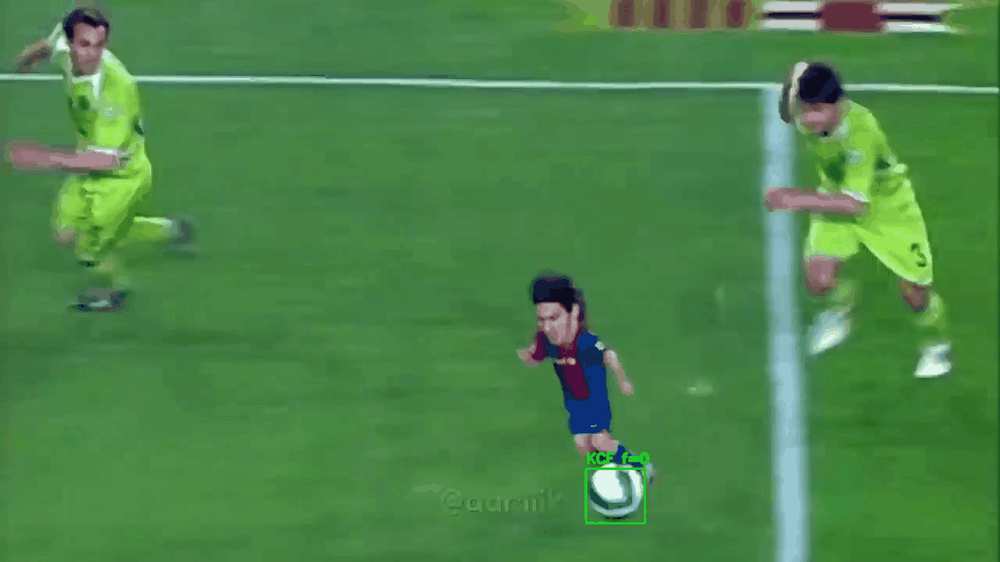

In [ ]:
print("KCF tracker result:");  display(IPImage(filename=gif_kcf))

CSRT tracker result:


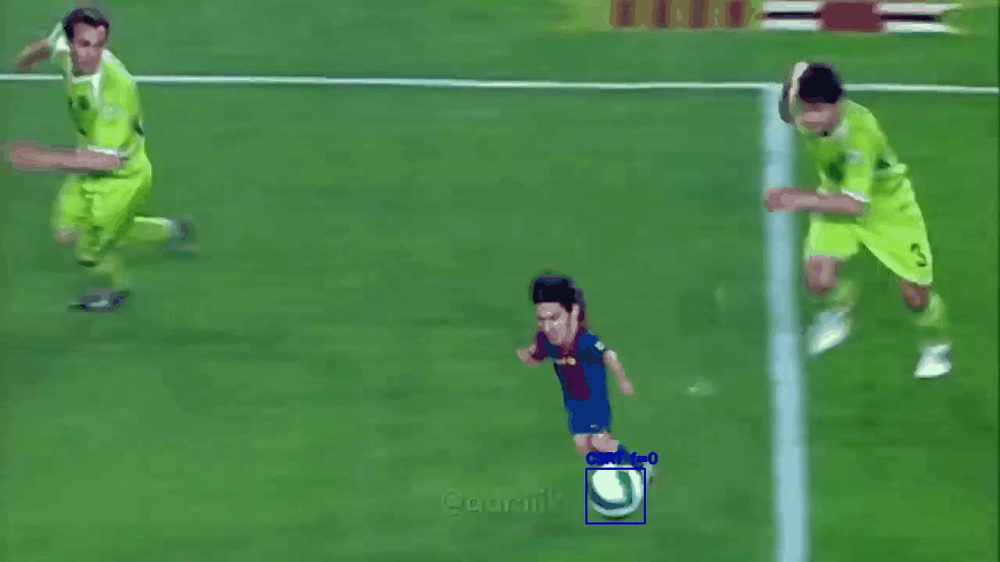

In [ ]:
print("CSRT tracker result:"); display(IPImage(filename=gif_csrt))

### Step 6 — Comparison
Compare the results

Do you see any differences? If so, what are they?

* Так. KCF швидко втрачає об’єкт, тоді як CSRT стабільно його відстежує.

Does one tracker perform better than the other? In what way?

* CSRT працює значно надійніше — він точніше реагує на зміни масштабу та положення об’єкта, а KCF швидко зриває трек.